# Architecture x binning: reconstruction capability analysis

Methodology: see [`methodology.md`](./methodology.md) in this folder for the experiment's
scientific motivation (architecture/binning search for m/z-accurate reconstruction).

Reads the on-disk grid campaign materialized from
[`architecture_binning_experiment.yaml`](./architecture_binning_experiment.yaml) through the
generic campaign reader
(`msi_autoencoder_wrapper.analysis.autoencoder.experiments.campaign_reader`) plus the two topic
modules built for this campaign's grid shape
(`analysis.autoencoder.reconstruction.architecture_overview_analysis`,
`...training_dynamics_analysis`).

**Part 1 — model comparison overview**: architecture x binning parameter-count table (latent
dimension is fixed across the whole grid), dataset summary.

**Part 2 — training dynamics**: train/validation loss vs. epoch, one figure per binning step
(color = architecture, thin = individual repetition, thick = mean across repetitions), plus mean
epoch duration per architecture x binning joined against parameter count.


In [23]:
import os
from pathlib import Path

import pandas as pd

current_path = Path.cwd().resolve()
repository_root = next(path for path in (current_path, *current_path.parents) if (path / "pyproject.toml").is_file())
os.chdir(repository_root)

from msi_autoencoder_wrapper.analysis.autoencoder.experiments import read_campaign
from msi_autoencoder_wrapper.analysis.autoencoder.reconstruction.architecture_overview_analysis import (
    architecture_grid_parameters,
    dataset_summary,
    parameter_count_table,
    plot_parameter_counts,
)
from msi_autoencoder_wrapper.analysis.autoencoder.reconstruction.training_dynamics_analysis import (
    epoch_duration_summary,
    final_performance_summary,
    plot_epoch_duration,
    plot_training_curves_by_binning,
    training_curves_frame,
)


## Config 

Here you can choose different workspace and binning 

In [24]:
# Workspace root and the experiment.name of the campaign to read (see
# architecture_binning_experiment.yaml: experiment.name / task.parameters.factory_parameters.project_path).
WORKSPACE = "data/kidney_workspace"
EXPERIMENT_NAME = "kidney-architecture-binning"


## Experiment settings — what this campaign actually ran

Read once here so every reader of this notebook knows the grid shape before looking at any result below.

In [25]:
tasks = read_campaign(WORKSPACE, EXPERIMENT_NAME)

architectures = sorted({architecture_grid_parameters(task)["name"] for task in tasks})
binning_steps = sorted({architecture_grid_parameters(task)["binning_step"] for task in tasks})
repetitions = sorted({task.repetition for task in tasks})
completed = sum(task.status == "completed" for task in tasks)

print(f"architectures ({len(architectures)}): {architectures}")
print(f"binning steps (Δm/z, {len(binning_steps)}): {binning_steps}")
print(f"repetitions per grid cell: {len(repetitions)}")
print(f"tasks: {completed}/{len(tasks)} completed")


2026-08-18 21:36:16,545 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.experiments.campaign_reader:116 | Reading 60 task manifest(s) for campaign 'kidney-architecture-binning'.
2026-08-18 21:36:18,763 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.experiments.campaign_reader:132 | Campaign 'kidney-architecture-binning' status breakdown: {'completed': 60}.
architectures (3): ['conv1d-ae-32-16-8-latent-10', 'mlp-ae-512-256-latent-10', 'mlp-ae-512-latent-10']
binning steps (Δm/z, 4): [0.45, 0.5, 0.55, 1.0]
repetitions per grid cell: 5
tasks: 60/60 completed


## Part 1 — model comparison overview

Real parameter counts (reconstructed architecture, no weights needed) against the fixed latent
dimension, per architecture x binning step — binning changes the input dimensionality, so the
same architecture has a different parameter count at each binning step. See
`parameter_count_table`'s docstring for exactly what is deduplicated across repetitions.

In [48]:
parameter_counts = parameter_count_table(tasks)

2026-08-18 21:40:31,121 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:40:31,121 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:40:31,122 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:40:31,123 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:40:31,129 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='MLPDecoder'.
2026-08-18 21:40:31,135 | INFO     | msi_autoencoder_wrapper.models.architectu

In [27]:
pd.DataFrame(parameter_counts).sort_values(["architecture", "binning_step"]).reset_index(drop=True)

,architecture,preset,binning_step,latent_dim,input_dim,total_parameters
0,conv1d-ae-32-16-8-latent-10,CNNAutoencoder,0.45,10,1556,19825
1,conv1d-ae-32-16-8-latent-10,CNNAutoencoder,0.50,10,1400,18433
2,conv1d-ae-32-16-8-latent-10,CNNAutoencoder,0.55,10,1273,17279
3,conv1d-ae-32-16-8-latent-10,CNNAutoencoder,1.00,10,700,12353
4,mlp-ae-512-256-latent-10,MLPAutoencoder,0.45,10,1556,1866782
5,mlp-ae-512-256-latent-10,MLPAutoencoder,0.50,10,1400,1706882
6,mlp-ae-512-256-latent-10,MLPAutoencoder,0.55,10,1273,1576707
7,mlp-ae-512-256-latent-10,MLPAutoencoder,1.00,10,700,989382
8,mlp-ae-512-latent-10,MLPAutoencoder,0.45,10,1556,1608222
9,mlp-ae-512-latent-10,MLPAutoencoder,0.50,10,1400,1448322


Dataset behind every task in this campaign (shared subset fraction and split seed across the whole grid — see `dataset_summary`'s docstring).

In [28]:
dataset_summary(tasks)

{'normalization': 'tic',
 'split_strategy': 'predefined',
 'split_seed': 42,
 'train': 33756,
 'validation': 4219,
 'test': 4220,
 'total': 42195}

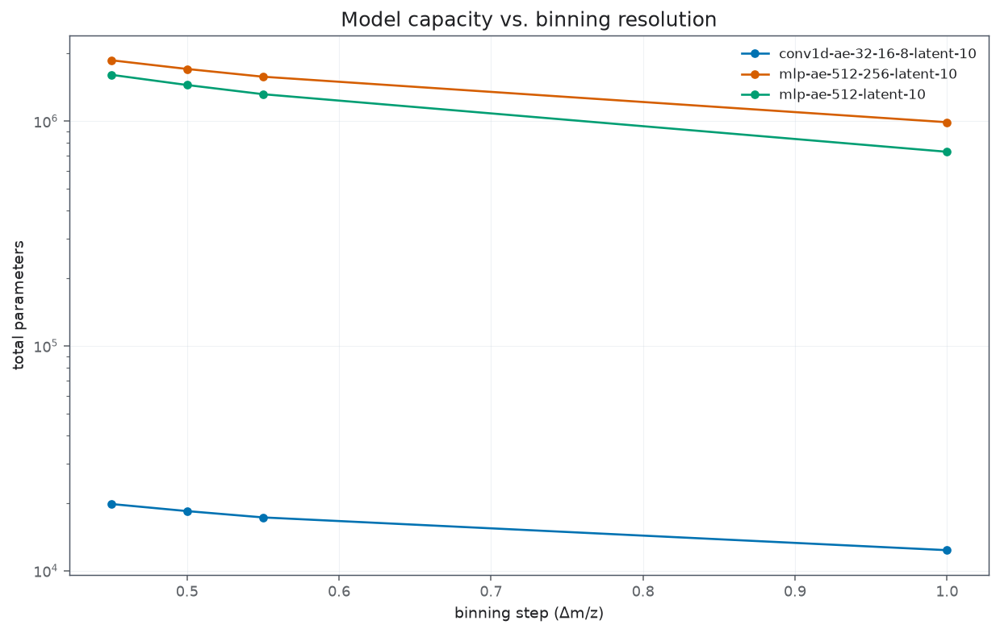

In [29]:
_ = plot_parameter_counts(parameter_counts)

Parameter counts span almost two orders of magnitude between architecture families (the y-axis
above is logarithmic for that reason), so a quick note on *why* `conv1d-ae-32-16-8-latent-10` is
so much smaller: its three stride-3 convolutions shrink the m/z axis by ~27x *before* any dense
layer runs, so the flatten-to-latent projection only ever sees a few hundred values. Both MLP
variants instead start with a full dense `input_dim x 512` matrix, which dominates their
parameter count. This is expected from the architectures, not a bug in the count.


## Part 2 — training dynamics

Per-epoch train/validation loss, flattened across every completed task (`training_curves_frame`
skips the trailing post-training test-split evaluation entry — see its docstring).

In [30]:
frame = training_curves_frame(tasks)
pd.DataFrame(frame)


2026-08-18 21:36:19,511 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.reconstruction.training_dynamics_analysis:78 | Built training-curve frame with 600 epoch row(s) from 60 task(s).


,task_id,architecture,binning_step,repetition,epoch,train_loss,validation_loss,best_loss,duration
0,task_000000,mlp-ae-512-latent-10,0.45,0,1,4936.399510,166.564438,166.564438,82.481631
1,task_000000,mlp-ae-512-latent-10,0.45,0,2,84.299843,141.663644,141.663644,69.885858
2,task_000000,mlp-ae-512-latent-10,0.45,0,3,60.623132,227.125113,141.663644,65.463202
3,task_000000,mlp-ae-512-latent-10,0.45,0,4,45.422157,58.264150,58.264150,67.092925
4,task_000000,mlp-ae-512-latent-10,0.45,0,5,37.917059,121.514444,58.264150,57.267407
...,...,...,...,...,...,...,...,...,...
595,task_000059,conv1d-ae-32-16-8-latent-10,1.00,4,6,21.485095,19.279531,19.279531,62.227835
596,task_000059,conv1d-ae-32-16-8-latent-10,1.00,4,7,17.965978,18.112556,18.112556,62.027943
597,task_000059,conv1d-ae-32-16-8-latent-10,1.00,4,8,15.561577,14.658152,14.658152,61.925094
598,task_000059,conv1d-ae-32-16-8-latent-10,1.00,4,9,14.082904,13.344339,13.344339,62.007306


Mean epoch duration per architecture x binning step, joined against parameter count — how fast each model type trains, at each input size.

In [31]:
duration_summary = epoch_duration_summary(frame, parameter_counts)
pd.DataFrame(duration_summary).sort_values(["architecture", "binning_step"]).reset_index(drop=True)


,architecture,binning_step,total_parameters,mean_epoch_duration,std_epoch_duration,mean_total_duration,epoch_count
0,conv1d-ae-32-16-8-latent-10,0.45,19825,69.850553,6.209009,698.505534,50
1,conv1d-ae-32-16-8-latent-10,0.50,18433,65.247411,2.326418,652.474106,50
2,conv1d-ae-32-16-8-latent-10,0.55,17279,64.538101,1.094870,645.381005,50
3,conv1d-ae-32-16-8-latent-10,1.00,12353,62.307517,0.641353,623.075168,50
4,mlp-ae-512-256-latent-10,0.45,1866782,66.990728,8.425594,669.907284,50
5,mlp-ae-512-256-latent-10,0.50,1706882,73.831983,6.734934,738.319826,50
6,mlp-ae-512-256-latent-10,0.55,1576707,77.399525,10.925777,773.995251,50
7,mlp-ae-512-256-latent-10,1.00,989382,68.265170,7.547060,682.651697,50
8,mlp-ae-512-latent-10,0.45,1608222,60.335828,4.232329,603.358281,50
9,mlp-ae-512-latent-10,0.50,1448322,61.606467,1.886089,616.064668,50


`mean_total_duration` is the practical figure: one full run's summed epoch durations, averaged
across repetitions (as opposed to `mean_epoch_duration`, which pools every individual epoch
measurement). Plotted the same way as the parameter-count plot above for direct comparison.


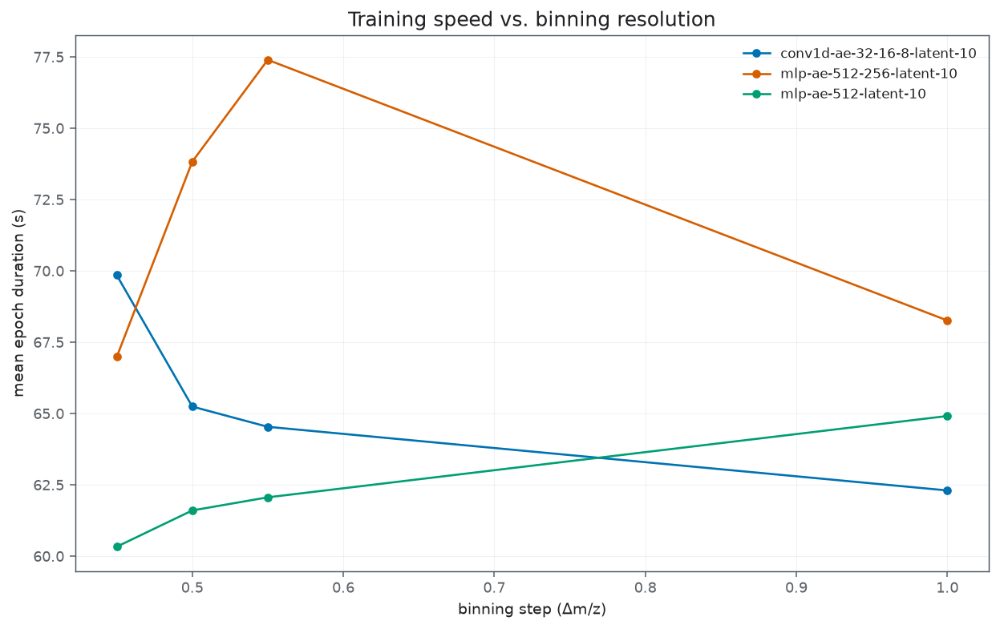

In [32]:
_ = plot_epoch_duration(duration_summary)


Train (solid) vs. validation (dashed) loss vs. epoch, **one figure per binning step**, all
sharing the same log-scale y-axis (and x-axis) so the figures stay comparable to each other —
see `plot_training_curves_by_binning`'s docstring for exactly how that shared range is computed.
Color = architecture; thin unlabeled lines = individual repetitions; thick labeled lines = mean
across repetitions. Overlaying train and validation on one axes (instead of two separate panels)
makes the generalization gap directly readable as the vertical distance between a solid line and
its matching dashed line.


rendered 4 binning-step figure(s)


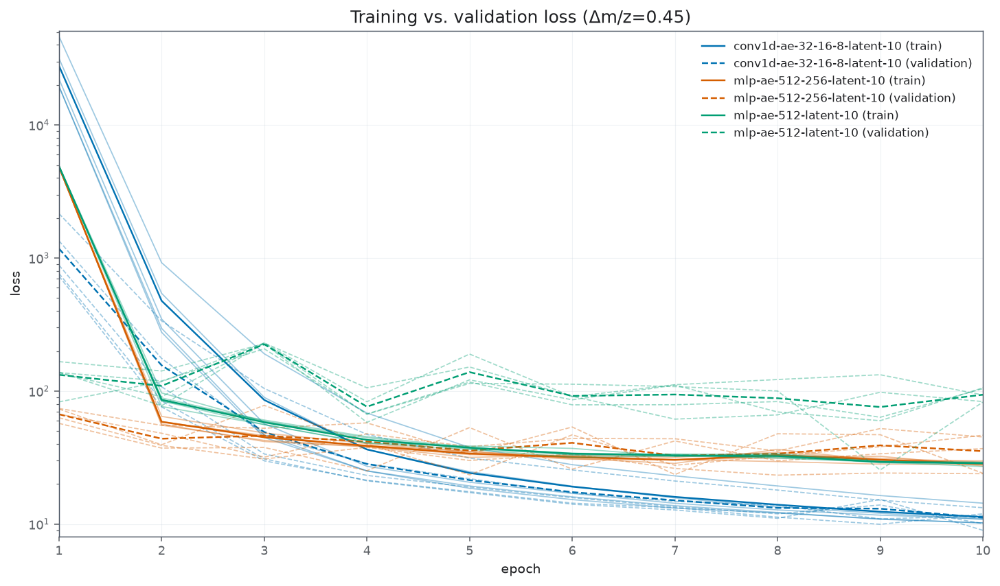

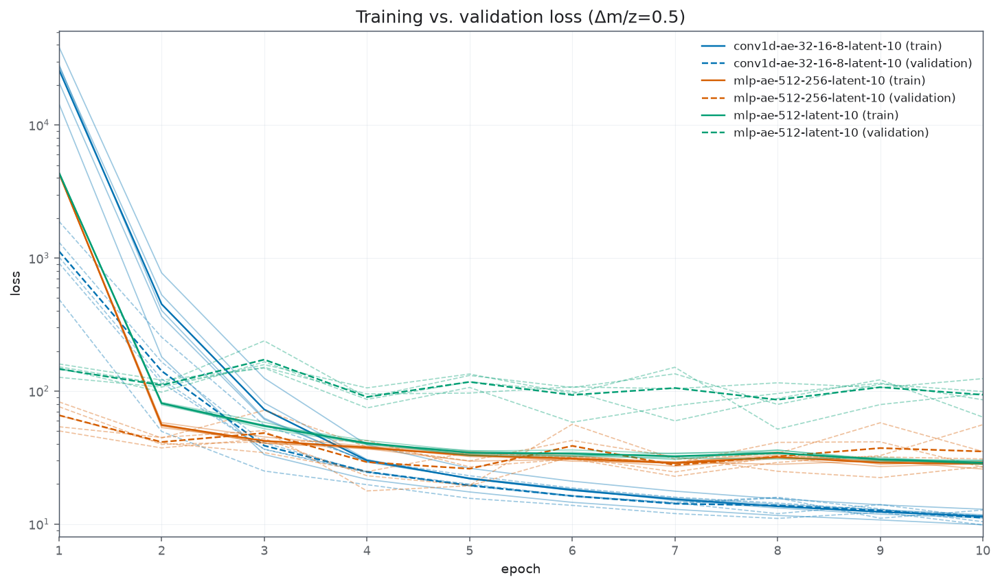

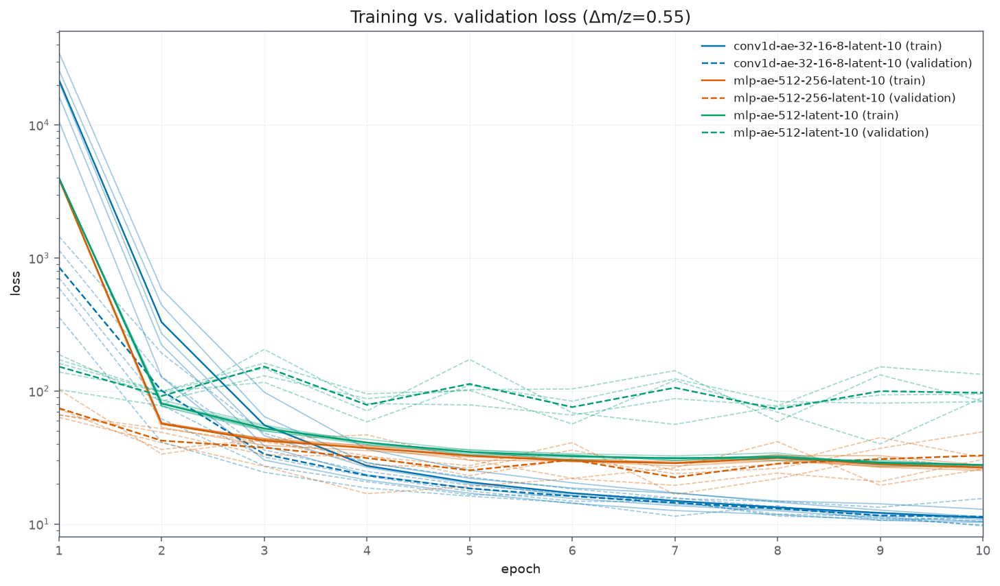

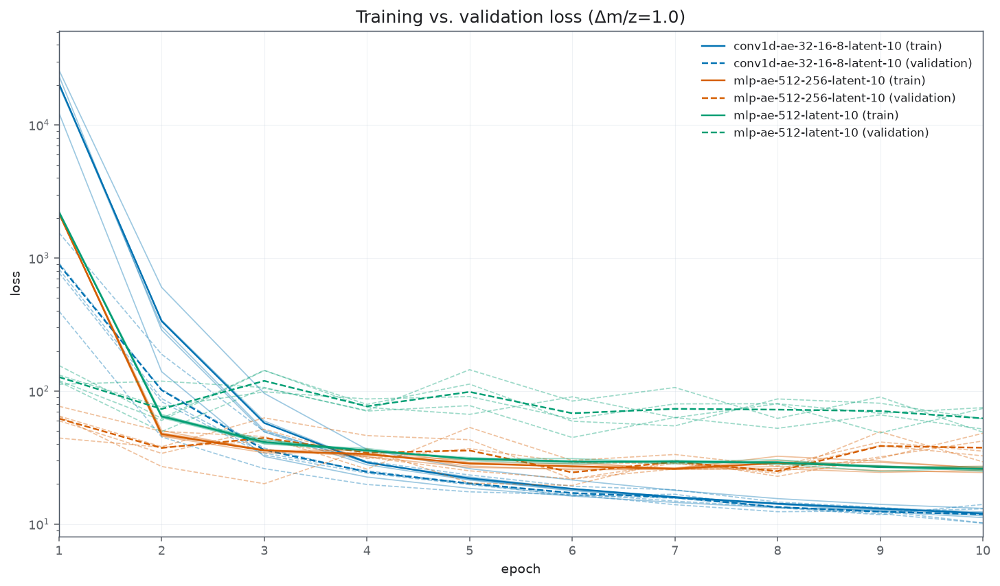

In [33]:
binning_figures = plot_training_curves_by_binning(frame)
print(f"rendered {len(binning_figures)} binning-step figure(s)")


## Final result — best (architecture, binning step) by validation loss

Ranks every (architecture, binning step) combination by the mean of its repetitions' best
(running-minimum) validation loss — the value each run's checkpoint restore actually used. See
`final_performance_summary`'s docstring for why the last epoch's `best_loss` is read directly
instead of re-deriving a minimum here.


In [34]:
final_summary = final_performance_summary(frame)
pd.DataFrame(final_summary)


,architecture,binning_step,mean_best_validation_loss,std_best_validation_loss,best_task_id,best_validation_loss,run_count
0,conv1d-ae-32-16-8-latent-10,0.45,10.658020,1.455221,task_000044,8.993940,5
1,conv1d-ae-32-16-8-latent-10,0.50,10.827485,0.597747,task_000045,9.870891,5
2,conv1d-ae-32-16-8-latent-10,0.55,10.831900,1.335093,task_000054,9.684984,5
3,conv1d-ae-32-16-8-latent-10,1.00,11.272218,0.910826,task_000056,10.167157,5
4,mlp-ae-512-256-latent-10,0.55,20.361248,3.443887,task_000030,16.723484,5
5,mlp-ae-512-256-latent-10,0.50,21.461011,2.467174,task_000029,17.774987,5
6,mlp-ae-512-256-latent-10,1.00,22.660805,2.174617,task_000035,19.544184,5
7,mlp-ae-512-256-latent-10,0.45,25.502520,3.263282,task_000023,23.345223,5
8,mlp-ae-512-latent-10,1.00,51.910136,6.113370,task_000019,44.812650,5
9,mlp-ae-512-latent-10,0.55,56.013645,8.624429,task_000011,40.060202,5


## Part 3 — binning selection using the winning architecture's actual reconstruction

Part 2 picked the architecture below as the best performer. The open question now is *which
binning step to actually use* — the two competing hypotheses (see `methodology.md`): (1) `0.45`
vs. `0.55` make no practical difference, or (2) the coarsest step (`1.0`) is already sufficient
(only the nearest bin matters). Both are decided the same way as the rest of the "which binning"
analysis (`binning_analysis_0.45-0.55.ipynb`): by matching the candidate against the raw,
unbinned spectrum with `match_spectral_points` and reading the Masserstein (1D Wasserstein —
*not* Euclidean; see `metrics.spectral_points.spectral_point_metrics`) localization distance. The
only difference here is that the candidate is `model(B(X))` — the winning architecture's actual
trained reconstruction — instead of `B(X)` itself, which is the only way to see what a *trained
model* discards on top of what forward binning alone already discards.

**Every model here was trained on TIC-normalized spectra** (`PixelDataset`'s own normalization) —
feeding it raw, unnormalized binned intensities is out-of-distribution input and produces a
degenerate reconstruction that looks like "the model predicts almost nothing." The reference raw
spectrum is normalized with the *identical* formula before every comparison and plot below, so
everything in this section — sweep, tradeoff curve, mirrored plots, train/test comparison — is
consistently on TIC scale. See `model_reconstruction_analysis`'s module docstring for the exact
reasoning.

Reuses `binner_forward_analysis.plot_metric_by_delta_m`/`plot_forward_tradeoff` unchanged — see
`model_reconstruction_analysis.model_reconstruction_records`'s docstring for why its output shares
`forward_sweep_records`'s exact record schema.


In [35]:
from msi_autoencoder_wrapper.readers.strategies.pyimzml_reader import PyImzMLReader
from msi_autoencoder_wrapper.analysis.autoencoder.binning.precompute import BinningPrecompute
from msi_autoencoder_wrapper.analysis.autoencoder.binning.binner_forward_analysis import (
    plot_metric_by_delta_m,
    plot_forward_tradeoff,
    summarize_forward_sweep,
)
from msi_autoencoder_wrapper.analysis.autoencoder.binning.model_reconstruction_analysis import (
    group_tasks_by_binning,
    model_reconstruction_records,
    plot_ranked_model_reconstructions,
    sample_split_ids,
)


### Config — Part 3

In [36]:
IMAGE_PATH = "data/kidney_workspace/datasets/kidney/kidney.imzML"
SAMPLE_SIZE = 500
RANDOM_SEED = 7
TOLERANCE = 0.01
TOLERANCE_UNIT = "Da"
SPLIT_SAMPLE_SIZE = 200  # for the train/test comparison further below

# Reuses Part 2's ranking rather than hardcoding a name, so this section always
# tracks whichever architecture Part 2's final_summary currently ranks first.
WINNING_ARCHITECTURE = final_summary[0]["architecture"]
print(f"winning architecture (Part 2): {WINNING_ARCHITECTURE}")


winning architecture (Part 2): conv1d-ae-32-16-8-latent-10


In [37]:
final_summary

[{'architecture': 'conv1d-ae-32-16-8-latent-10',
  'binning_step': 0.45,
  'mean_best_validation_loss': 10.658020090334343,
  'std_best_validation_loss': 1.4552206157877559,
  'best_task_id': 'task_000044',
  'best_validation_loss': 8.99394007885095,
  'run_count': 5},
 {'architecture': 'conv1d-ae-32-16-8-latent-10',
  'binning_step': 0.5,
  'mean_best_validation_loss': 10.827484557122894,
  'std_best_validation_loss': 0.5977468860355053,
  'best_task_id': 'task_000045',
  'best_validation_loss': 9.8708912748279,
  'run_count': 5},
 {'architecture': 'conv1d-ae-32-16-8-latent-10',
  'binning_step': 0.55,
  'mean_best_validation_loss': 10.831900349530308,
  'std_best_validation_loss': 1.3350934697022812,
  'best_task_id': 'task_000054',
  'best_validation_loss': 9.684984012083573,
  'run_count': 5},
 {'architecture': 'conv1d-ae-32-16-8-latent-10',
  'binning_step': 1.0,
  'mean_best_validation_loss': 11.272217845916748,
  'std_best_validation_loss': 0.9108258809512884,
  'best_task_id': 

In [38]:
reader = PyImzMLReader(IMAGE_PATH)
precompute = BinningPrecompute(reader, sample_size=SAMPLE_SIZE, seed=RANDOM_SEED).load_raw()

tasks_by_binning = group_tasks_by_binning(tasks, WINNING_ARCHITECTURE)
print({step: len(repetitions) for step, repetitions in tasks_by_binning.items()})


2026-08-18 21:37:04,969 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.precompute:78 | BinningPrecompute sample resolved: 500 of 421955 spectra (seed=7, capped=False).
2026-08-18 21:37:04,969 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.precompute:100 | START reading 500 raw spectra from the reader.


Reading raw spectra:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:37:05,560 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.precompute:105 | DONE reading 500 raw spectra in 0.59s.
{0.45: 5, 0.5: 5, 0.55: 5, 1.0: 5}


Runs every repetition (not just the best) so the sweep below reflects both sample-to-sample
and repetition-to-repetition variability — this is what answers "how stable is convergence for
this binning" from the earlier discussion, not just a single point estimate.

In [39]:
model_records = model_reconstruction_records(
    precompute, tasks_by_binning, tolerance=TOLERANCE, tolerance_unit=TOLERANCE_UNIT,
)


2026-08-18 21:37:05,643 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.model_reconstruction_analysis:280 | START model-reconstruction sweep: 500 spectra x 4 binning step(s).
2026-08-18 21:37:05,659 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:37:05,660 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:37:05,661 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:37:05,662 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='CNNEncoder'.
2026-08-18 21:37:05,736 | INFO     | msi_autoencoder_wrapper.models.architectures.archit

Forward binning Δm=0.45:   0%|          | 0/500 [00:00<?, ?spectrum/s]

/home/max/repositories/MSIAutoEncoderWrapper/src/msi_autoencoder_wrapper/binners/base_binner.py:46: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:203.)
  intensity_tensor = torch.as_tensor(intensities, dtype=self.dtype)


2026-08-18 21:37:08,202 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.precompute:177 | DONE forward-binning at bin_step=0.45 in 2.31s.
2026-08-18 21:37:09,226 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.model_reconstruction_analysis:301 | Reconstructed 500 spectra with task 'task_000040' (Δm/z=0.45, normalization=tic) in 1.02s.


Matching task_000040 Δm=0.45:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:37:13,197 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:37:13,198 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:37:13,198 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:37:13,199 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='CNNEncoder'.
2026-08-18 21:37:13,203 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='CNNDecoder'.
2026-08-18 21:37:13,206 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000041 Δm=0.45:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:37:18,132 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:37:18,133 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:37:18,134 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:37:18,135 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='CNNEncoder'.
2026-08-18 21:37:18,138 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='CNNDecoder'.
2026-08-18 21:37:18,143 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000042 Δm=0.45:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:37:22,644 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:37:22,645 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:37:22,645 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:37:22,646 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='CNNEncoder'.
2026-08-18 21:37:22,648 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='CNNDecoder'.
2026-08-18 21:37:22,654 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000043 Δm=0.45:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:37:27,169 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:37:27,170 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:37:27,170 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:37:27,171 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='CNNEncoder'.
2026-08-18 21:37:27,174 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='CNNDecoder'.
2026-08-18 21:37:27,179 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000044 Δm=0.45:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:37:30,591 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:37:30,592 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:37:30,592 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:37:30,593 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='CNNEncoder'.
2026-08-18 21:37:30,595 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='CNNDecoder'.
2026-08-18 21:37:30,598 | INFO     | msi_autoencoder_wrapper.models.architectu

Forward binning Δm=0.5:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:37:31,039 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.precompute:177 | DONE forward-binning at bin_step=0.5 in 0.43s.
2026-08-18 21:37:31,122 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.model_reconstruction_analysis:301 | Reconstructed 500 spectra with task 'task_000045' (Δm/z=0.5, normalization=tic) in 0.08s.


Matching task_000045 Δm=0.5:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:37:34,717 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:37:34,718 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:37:34,719 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:37:34,719 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='CNNEncoder'.
2026-08-18 21:37:34,723 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='CNNDecoder'.
2026-08-18 21:37:34,726 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000046 Δm=0.5:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:37:40,525 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:37:40,526 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:37:40,527 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:37:40,527 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='CNNEncoder'.
2026-08-18 21:37:40,530 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='CNNDecoder'.
2026-08-18 21:37:40,535 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000047 Δm=0.5:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:37:45,257 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:37:45,258 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:37:45,259 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:37:45,259 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='CNNEncoder'.
2026-08-18 21:37:45,261 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='CNNDecoder'.
2026-08-18 21:37:45,266 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000048 Δm=0.5:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:37:49,407 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:37:49,407 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:37:49,408 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:37:49,408 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='CNNEncoder'.
2026-08-18 21:37:49,411 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='CNNDecoder'.
2026-08-18 21:37:49,416 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000049 Δm=0.5:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:37:53,072 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:37:53,072 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:37:53,073 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:37:53,074 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='CNNEncoder'.
2026-08-18 21:37:53,077 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='CNNDecoder'.
2026-08-18 21:37:53,084 | INFO     | msi_autoencoder_wrapper.models.architectu

Forward binning Δm=0.55:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:37:55,343 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.precompute:177 | DONE forward-binning at bin_step=0.55 in 2.20s.
2026-08-18 21:37:55,533 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.model_reconstruction_analysis:301 | Reconstructed 500 spectra with task 'task_000050' (Δm/z=0.55, normalization=tic) in 0.19s.


Matching task_000050 Δm=0.55:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:37:58,974 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:37:58,974 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:37:58,975 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:37:58,976 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='CNNEncoder'.
2026-08-18 21:37:58,979 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='CNNDecoder'.
2026-08-18 21:37:58,981 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000051 Δm=0.55:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:38:02,726 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:38:02,727 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:38:02,728 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:38:02,728 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='CNNEncoder'.
2026-08-18 21:38:02,731 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='CNNDecoder'.
2026-08-18 21:38:02,735 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000052 Δm=0.55:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:38:08,259 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:38:08,259 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:38:08,260 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:38:08,261 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='CNNEncoder'.
2026-08-18 21:38:08,264 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='CNNDecoder'.
2026-08-18 21:38:08,269 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000053 Δm=0.55:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:38:13,461 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:38:13,465 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:38:13,466 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:38:13,466 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='CNNEncoder'.
2026-08-18 21:38:13,469 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='CNNDecoder'.
2026-08-18 21:38:13,472 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000054 Δm=0.55:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:38:17,440 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:38:17,441 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:38:17,441 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:38:17,442 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='CNNEncoder'.
2026-08-18 21:38:17,444 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='CNNDecoder'.
2026-08-18 21:38:17,448 | INFO     | msi_autoencoder_wrapper.models.architectu

Forward binning Δm=1:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:38:17,876 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.precompute:177 | DONE forward-binning at bin_step=1.0 in 0.42s.
2026-08-18 21:38:17,936 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.model_reconstruction_analysis:301 | Reconstructed 500 spectra with task 'task_000055' (Δm/z=1.0, normalization=tic) in 0.06s.


Matching task_000055 Δm=1:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:38:21,181 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:38:21,182 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:38:21,182 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:38:21,183 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='CNNEncoder'.
2026-08-18 21:38:21,185 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='CNNDecoder'.
2026-08-18 21:38:21,190 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000056 Δm=1:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:38:24,115 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:38:24,116 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:38:24,116 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:38:24,117 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='CNNEncoder'.
2026-08-18 21:38:24,120 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='CNNDecoder'.
2026-08-18 21:38:24,124 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000057 Δm=1:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:38:26,945 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:38:26,946 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:38:26,946 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:38:26,947 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='CNNEncoder'.
2026-08-18 21:38:26,950 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='CNNDecoder'.
2026-08-18 21:38:26,953 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000058 Δm=1:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:38:29,680 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:38:29,681 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:38:29,682 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:38:29,682 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='CNNEncoder'.
2026-08-18 21:38:29,684 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='CNNDecoder'.
2026-08-18 21:38:29,687 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000059 Δm=1:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:38:32,427 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.model_reconstruction_analysis:321 | DONE model-reconstruction sweep: 250000 records in 86.78s.


### Error distribution and stability across binning steps

One overlaid histogram (all binning steps, all repetitions, all sampled spectra) followed by the
median + interquartile tradeoff curve — the same two-plot pattern used for the pure-binning sweep
in `binning_analysis_0.45-0.55.ipynb`, just fed model-reconstruction records instead.

(<Figure size 1470x868 with 1 Axes>,
 <Axes: title={'left': 'wasserstein (tic) across Δm'}, xlabel='wasserstein', ylabel='density'>)

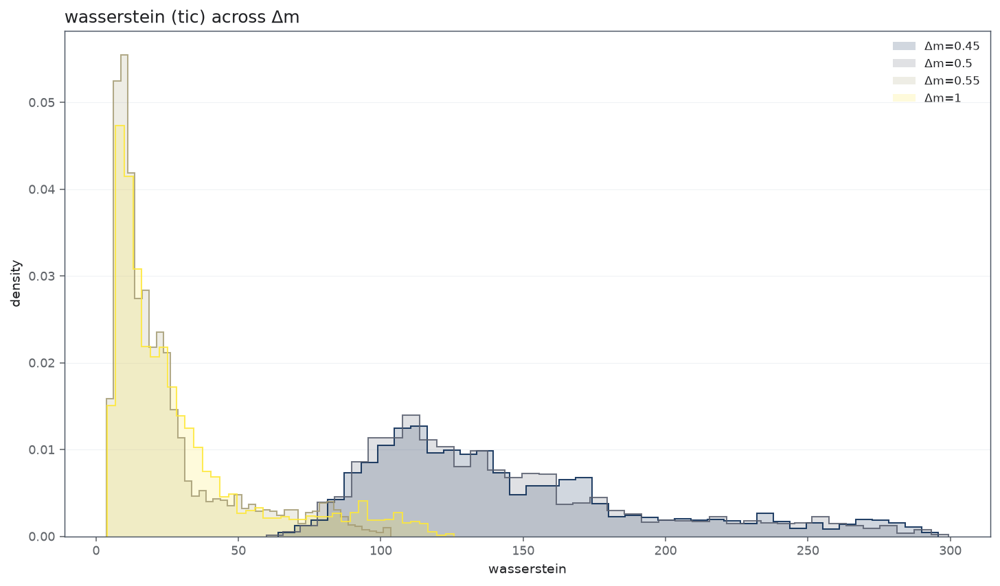

In [40]:
plot_metric_by_delta_m(model_records, "wasserstein", normalization="tic", kind="histogram")


(<Figure size 1470x868 with 1 Axes>,
 <Axes: xlabel='delta_m', ylabel='wasserstein'>)

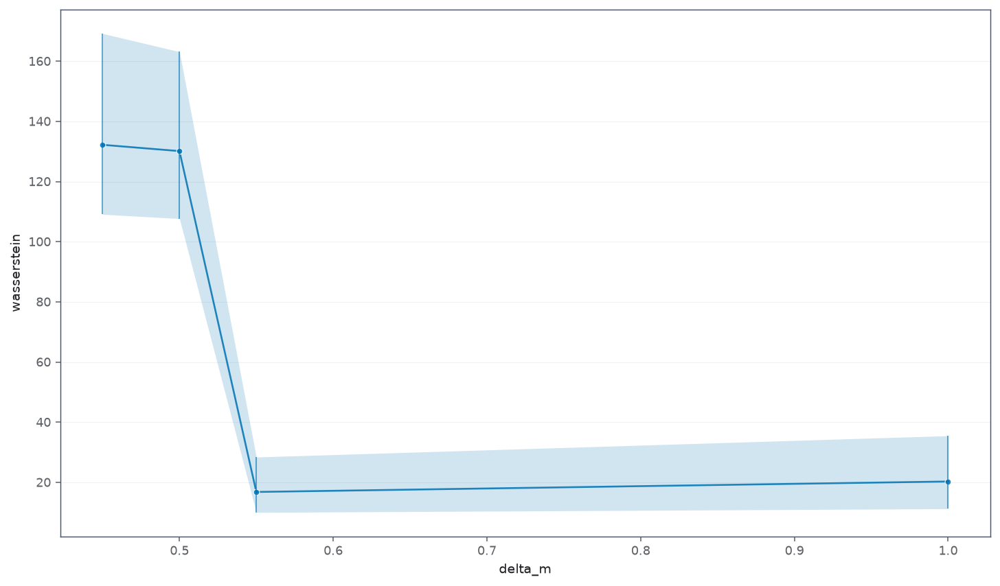

In [41]:
model_summary = summarize_forward_sweep(model_records)
plot_forward_tradeoff(model_summary, "wasserstein", x="delta_m", normalization="tic")


### Best/worst reconstructed spectra, per binning step

Uses each binning step's single best-performing repetition (`final_summary`'s `best_task_id`) —
showing every repetition here would be unreadable. Each spectrum gets a full view and a second
row zoomed to a fixed ±15 Da window centered on its single highest-intensity reference peak (the
densest region, not an arbitrary span between several possibly-distant peaks — see
`plot_ranked_model_reconstructions`'s docstring). Reference and reconstruction are both plotted on
the same TIC-normalized scale they are actually compared on.


2026-08-18 21:38:33,470 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.model_reconstruction_analysis:381 | Plotting 2 best + 2 worst reconstructed spectra for task_id=task_000044, metric=wasserstein.
2026-08-18 21:38:33,485 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:38:33,486 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:38:33,487 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:38:33,488 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='CNNEncoder'.
2026-08-18 21:38:33,491 | INFO     | msi_autoencoder_wrapper.m

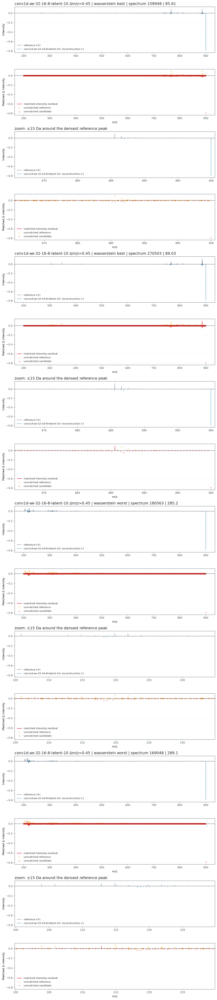

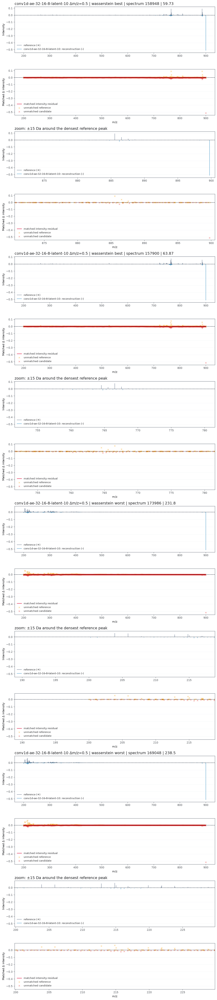

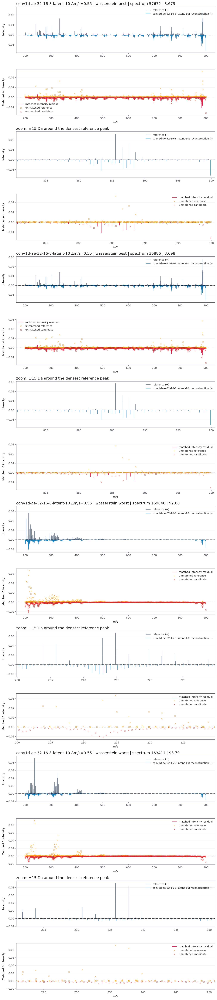

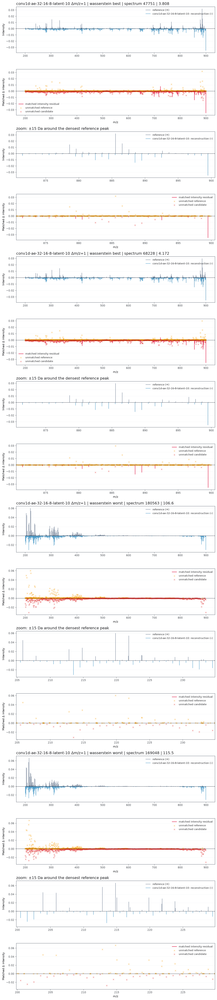

In [42]:
best_task_id_by_binning = {
    row["binning_step"]: row["best_task_id"]
    for row in final_summary
    if row["architecture"] == WINNING_ARCHITECTURE
}
best_task_by_binning = {
    binning_step: next(task for task in repetitions if task.task_id == best_task_id_by_binning[binning_step])
    for binning_step, repetitions in tasks_by_binning.items()
}

for binning_step, task in best_task_by_binning.items():
    plot_ranked_model_reconstructions(precompute, model_records, task, metric="wasserstein", n_best=2, n_worst=2)


### Train vs. test — does reconstruction quality generalize to unseen pixels?

Same sweep, restricted to this campaign's saved `train`/`test` pixel indices (identical across
every task — one shared split, seeded once for the whole grid) instead of an arbitrary sample, one
plot per split so they can be read directly underneath each other. Uses only each binning step's
best repetition (the same one selected above), for the same readability reason.

In [43]:
reference_task = next(iter(best_task_by_binning.values()))
single_task_by_binning = {binning_step: [task] for binning_step, task in best_task_by_binning.items()}

train_precompute = BinningPrecompute(
    reader, spectrum_ids=sample_split_ids(reference_task, "train", SPLIT_SAMPLE_SIZE, RANDOM_SEED)
).load_raw()
test_precompute = BinningPrecompute(
    reader, spectrum_ids=sample_split_ids(reference_task, "test", SPLIT_SAMPLE_SIZE, RANDOM_SEED)
).load_raw()

train_records = model_reconstruction_records(train_precompute, single_task_by_binning, tolerance=TOLERANCE, tolerance_unit=TOLERANCE_UNIT)
test_records = model_reconstruction_records(test_precompute, single_task_by_binning, tolerance=TOLERANCE, tolerance_unit=TOLERANCE_UNIT)


2026-08-18 21:38:54,015 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.precompute:78 | BinningPrecompute sample resolved: 200 of 421955 spectra (seed=0, capped=False).
2026-08-18 21:38:54,016 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.precompute:100 | START reading 200 raw spectra from the reader.


Reading raw spectra:   0%|          | 0/200 [00:00<?, ?spectrum/s]

2026-08-18 21:38:54,267 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.precompute:105 | DONE reading 200 raw spectra in 0.25s.
2026-08-18 21:38:54,269 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.precompute:78 | BinningPrecompute sample resolved: 200 of 421955 spectra (seed=0, capped=False).
2026-08-18 21:38:54,269 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.precompute:100 | START reading 200 raw spectra from the reader.


Reading raw spectra:   0%|          | 0/200 [00:00<?, ?spectrum/s]

2026-08-18 21:38:54,503 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.precompute:105 | DONE reading 200 raw spectra in 0.23s.
2026-08-18 21:38:54,504 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.model_reconstruction_analysis:280 | START model-reconstruction sweep: 200 spectra x 4 binning step(s).
2026-08-18 21:38:54,522 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:38:54,523 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:38:54,524 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:38:54,525 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component su

Forward binning Δm=0.45:   0%|          | 0/200 [00:00<?, ?spectrum/s]

2026-08-18 21:38:54,762 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.precompute:177 | DONE forward-binning at bin_step=0.45 in 0.22s.
2026-08-18 21:38:54,806 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.model_reconstruction_analysis:301 | Reconstructed 200 spectra with task 'task_000044' (Δm/z=0.45, normalization=tic) in 0.04s.


Matching task_000044 Δm=0.45:   0%|          | 0/200 [00:00<?, ?spectrum/s]

2026-08-18 21:38:56,075 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:38:56,076 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:38:56,076 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:38:56,077 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='CNNEncoder'.
2026-08-18 21:38:56,081 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='CNNDecoder'.
2026-08-18 21:38:56,083 | INFO     | msi_autoencoder_wrapper.models.architectu

Forward binning Δm=0.5:   0%|          | 0/200 [00:00<?, ?spectrum/s]

2026-08-18 21:38:56,896 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.precompute:177 | DONE forward-binning at bin_step=0.5 in 0.80s.
2026-08-18 21:38:56,951 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.model_reconstruction_analysis:301 | Reconstructed 200 spectra with task 'task_000045' (Δm/z=0.5, normalization=tic) in 0.05s.


Matching task_000045 Δm=0.5:   0%|          | 0/200 [00:00<?, ?spectrum/s]

2026-08-18 21:38:58,733 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:38:58,733 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:38:58,734 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:38:58,735 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='CNNEncoder'.
2026-08-18 21:38:58,739 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='CNNDecoder'.
2026-08-18 21:38:58,742 | INFO     | msi_autoencoder_wrapper.models.architectu

Forward binning Δm=0.55:   0%|          | 0/200 [00:00<?, ?spectrum/s]

2026-08-18 21:38:59,435 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.precompute:177 | DONE forward-binning at bin_step=0.55 in 0.67s.
2026-08-18 21:38:59,775 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.model_reconstruction_analysis:301 | Reconstructed 200 spectra with task 'task_000054' (Δm/z=0.55, normalization=tic) in 0.34s.


Matching task_000054 Δm=0.55:   0%|          | 0/200 [00:00<?, ?spectrum/s]

2026-08-18 21:39:01,526 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:39:01,527 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:39:01,528 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:39:01,528 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='CNNEncoder'.
2026-08-18 21:39:01,536 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='CNNDecoder'.
2026-08-18 21:39:01,539 | INFO     | msi_autoencoder_wrapper.models.architectu

Forward binning Δm=1:   0%|          | 0/200 [00:00<?, ?spectrum/s]

2026-08-18 21:39:02,659 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.precompute:177 | DONE forward-binning at bin_step=1.0 in 1.10s.
2026-08-18 21:39:03,183 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.model_reconstruction_analysis:301 | Reconstructed 200 spectra with task 'task_000056' (Δm/z=1.0, normalization=tic) in 0.52s.


Matching task_000056 Δm=1:   0%|          | 0/200 [00:00<?, ?spectrum/s]

2026-08-18 21:39:04,908 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.model_reconstruction_analysis:321 | DONE model-reconstruction sweep: 20000 records in 10.40s.
2026-08-18 21:39:04,909 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.model_reconstruction_analysis:280 | START model-reconstruction sweep: 200 spectra x 4 binning step(s).
2026-08-18 21:39:04,965 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:39:04,966 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:39:04,966 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:39:04,967 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192

Forward binning Δm=0.45:   0%|          | 0/200 [00:00<?, ?spectrum/s]

2026-08-18 21:39:05,735 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.precompute:177 | DONE forward-binning at bin_step=0.45 in 0.75s.
2026-08-18 21:39:05,835 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.model_reconstruction_analysis:301 | Reconstructed 200 spectra with task 'task_000044' (Δm/z=0.45, normalization=tic) in 0.10s.


Matching task_000044 Δm=0.45:   0%|          | 0/200 [00:00<?, ?spectrum/s]

2026-08-18 21:39:06,942 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:39:06,943 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:39:06,944 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:39:06,944 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='CNNEncoder'.
2026-08-18 21:39:06,950 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='CNNDecoder'.
2026-08-18 21:39:06,952 | INFO     | msi_autoencoder_wrapper.models.architectu

Forward binning Δm=0.5:   0%|          | 0/200 [00:00<?, ?spectrum/s]

2026-08-18 21:39:07,380 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.precompute:177 | DONE forward-binning at bin_step=0.5 in 0.42s.
2026-08-18 21:39:07,671 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.model_reconstruction_analysis:301 | Reconstructed 200 spectra with task 'task_000045' (Δm/z=0.5, normalization=tic) in 0.29s.


Matching task_000045 Δm=0.5:   0%|          | 0/200 [00:00<?, ?spectrum/s]

2026-08-18 21:39:08,580 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:39:08,581 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:39:08,581 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:39:08,582 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='CNNEncoder'.
2026-08-18 21:39:08,586 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='CNNDecoder'.
2026-08-18 21:39:08,588 | INFO     | msi_autoencoder_wrapper.models.architectu

Forward binning Δm=0.55:   0%|          | 0/200 [00:00<?, ?spectrum/s]

2026-08-18 21:39:08,768 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.precompute:177 | DONE forward-binning at bin_step=0.55 in 0.17s.
2026-08-18 21:39:08,810 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.model_reconstruction_analysis:301 | Reconstructed 200 spectra with task 'task_000054' (Δm/z=0.55, normalization=tic) in 0.04s.


Matching task_000054 Δm=0.55:   0%|          | 0/200 [00:00<?, ?spectrum/s]

2026-08-18 21:39:09,711 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:39:09,712 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:39:09,713 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:39:09,714 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='CNNEncoder'.
2026-08-18 21:39:09,717 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='CNNDecoder'.
2026-08-18 21:39:09,719 | INFO     | msi_autoencoder_wrapper.models.architectu

Forward binning Δm=1:   0%|          | 0/200 [00:00<?, ?spectrum/s]

2026-08-18 21:39:09,880 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.precompute:177 | DONE forward-binning at bin_step=1.0 in 0.15s.
2026-08-18 21:39:09,918 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.model_reconstruction_analysis:301 | Reconstructed 200 spectra with task 'task_000056' (Δm/z=1.0, normalization=tic) in 0.04s.


Matching task_000056 Δm=1:   0%|          | 0/200 [00:00<?, ?spectrum/s]

2026-08-18 21:39:10,625 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.model_reconstruction_analysis:321 | DONE model-reconstruction sweep: 20000 records in 5.70s.


=== train ===
=== test ===


(<Figure size 1470x868 with 1 Axes>,
 <Axes: title={'left': 'wasserstein (tic) across Δm'}, xlabel='wasserstein', ylabel='density'>)

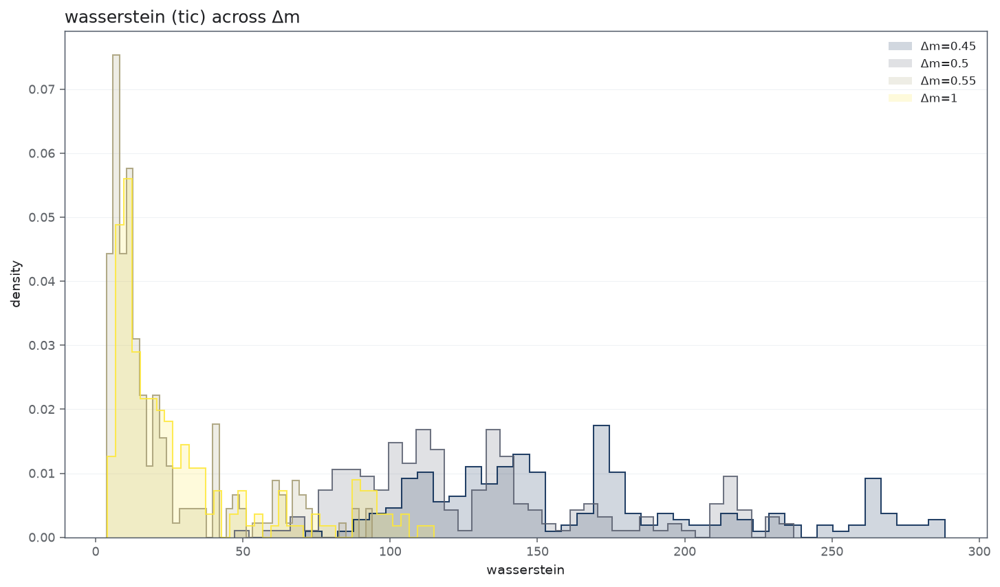

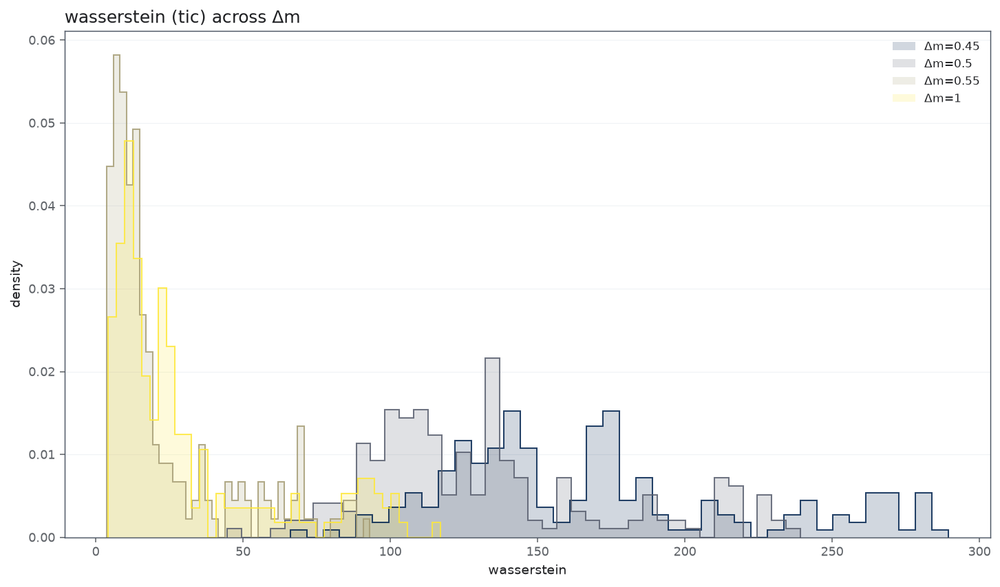

In [44]:
print("=== train ===")
plot_metric_by_delta_m(train_records, "wasserstein", normalization="tic", kind="histogram")
print("=== test ===")
plot_metric_by_delta_m(test_records, "wasserstein", normalization="tic", kind="histogram")


### Comparison: does a runner-up architecture look this bad too?

Same sweep (every repetition, same sample) for `mlp-ae-512-256-latent-10` — Part 2's runner-up —
to see whether "almost nothing gets reconstructed at the individual-peak level" is specific to the
winning architecture or a property of this whole campaign/metric.

In [45]:
COMPARISON_ARCHITECTURE = "mlp-ae-512-256-latent-10"

comparison_tasks_by_binning = group_tasks_by_binning(tasks, COMPARISON_ARCHITECTURE)
comparison_records = model_reconstruction_records(
    precompute, comparison_tasks_by_binning, tolerance=TOLERANCE, tolerance_unit=TOLERANCE_UNIT,
)
comparison_summary = summarize_forward_sweep(comparison_records)


2026-08-18 21:39:11,327 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.model_reconstruction_analysis:280 | START model-reconstruction sweep: 500 spectra x 4 binning step(s).
2026-08-18 21:39:11,344 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:39:11,344 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:39:11,345 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:39:11,346 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:39:11,352 | INFO     | msi_autoencoder_wrapper.models.architectures.archit

Matching task_000020 Δm=0.45:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:39:14,658 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:39:14,659 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:39:14,659 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:39:14,660 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:39:14,668 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='MLPDecoder'.
2026-08-18 21:39:14,675 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000021 Δm=0.45:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:39:18,507 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:39:18,508 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:39:18,509 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:39:18,510 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:39:18,516 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='MLPDecoder'.
2026-08-18 21:39:18,523 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000022 Δm=0.45:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:39:21,946 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:39:21,946 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:39:21,947 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:39:21,947 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:39:21,955 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='MLPDecoder'.
2026-08-18 21:39:21,960 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000023 Δm=0.45:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:39:25,526 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:39:25,527 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:39:25,528 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:39:25,529 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:39:25,535 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='MLPDecoder'.
2026-08-18 21:39:25,542 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000024 Δm=0.45:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:39:30,926 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:39:30,927 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:39:30,928 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:39:30,928 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:39:30,934 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='MLPDecoder'.
2026-08-18 21:39:30,940 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000025 Δm=0.5:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:39:33,921 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:39:33,922 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:39:33,922 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:39:33,923 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:39:33,930 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='MLPDecoder'.
2026-08-18 21:39:33,936 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000026 Δm=0.5:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:39:36,450 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:39:36,450 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:39:36,451 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:39:36,451 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:39:36,457 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='MLPDecoder'.
2026-08-18 21:39:36,464 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000027 Δm=0.5:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:39:39,086 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:39:39,087 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:39:39,087 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:39:39,088 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:39:39,096 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='MLPDecoder'.
2026-08-18 21:39:39,102 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000028 Δm=0.5:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:39:42,085 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:39:42,086 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:39:42,087 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:39:42,087 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:39:42,093 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='MLPDecoder'.
2026-08-18 21:39:42,099 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000029 Δm=0.5:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:39:45,342 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:39:45,343 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:39:45,344 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:39:45,345 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:39:45,351 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='MLPDecoder'.
2026-08-18 21:39:45,357 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000030 Δm=0.55:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:39:48,271 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:39:48,272 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:39:48,273 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:39:48,273 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:39:48,280 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='MLPDecoder'.
2026-08-18 21:39:48,286 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000031 Δm=0.55:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:39:51,393 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:39:51,394 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:39:51,395 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:39:51,396 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:39:51,401 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='MLPDecoder'.
2026-08-18 21:39:51,407 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000032 Δm=0.55:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:39:54,174 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:39:54,175 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:39:54,175 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:39:54,176 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:39:54,182 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='MLPDecoder'.
2026-08-18 21:39:54,188 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000033 Δm=0.55:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:39:56,856 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:39:56,857 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:39:56,858 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:39:56,859 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:39:56,866 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='MLPDecoder'.
2026-08-18 21:39:56,871 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000034 Δm=0.55:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:39:59,944 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:39:59,944 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:39:59,945 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:39:59,946 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:39:59,951 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='MLPDecoder'.
2026-08-18 21:39:59,954 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000035 Δm=1:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:40:02,032 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:40:02,033 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:40:02,033 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:40:02,034 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:40:02,037 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='MLPDecoder'.
2026-08-18 21:40:02,041 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000036 Δm=1:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:40:04,329 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:40:04,330 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:40:04,330 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:40:04,331 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:40:04,335 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='MLPDecoder'.
2026-08-18 21:40:04,339 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000037 Δm=1:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:40:07,033 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:40:07,034 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:40:07,034 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:40:07,035 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:40:07,039 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='MLPDecoder'.
2026-08-18 21:40:07,042 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000038 Δm=1:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:40:10,216 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:40:10,219 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:40:10,219 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:40:10,220 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:40:10,224 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='MLPDecoder'.
2026-08-18 21:40:10,228 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000039 Δm=1:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:40:13,413 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.model_reconstruction_analysis:321 | DONE model-reconstruction sweep: 250000 records in 62.08s.


In [46]:
wasserstein_by_architecture = pd.concat(
    [
        pd.DataFrame(
            [row for row in model_summary if row["metric"] == "wasserstein" and row["normalization"] == "tic"]
        ).assign(architecture=WINNING_ARCHITECTURE),
        pd.DataFrame(
            [row for row in comparison_summary if row["metric"] == "wasserstein" and row["normalization"] == "tic"]
        ).assign(architecture=COMPARISON_ARCHITECTURE),
    ],
    ignore_index=True,
)
wasserstein_by_architecture[["architecture", "delta_m", "median", "q25", "q75", "mean"]].sort_values(["architecture", "delta_m"])


,architecture,delta_m,median,q25,q75,mean
0,conv1d-ae-32-16-8-latent-10,0.45,132.195783,109.074908,169.181211,145.701213
1,conv1d-ae-32-16-8-latent-10,0.50,130.107348,107.662813,163.138089,142.857358
2,conv1d-ae-32-16-8-latent-10,0.55,16.797393,9.991693,28.391822,24.345874
3,conv1d-ae-32-16-8-latent-10,1.00,20.271829,11.205981,35.473017,29.223154
4,mlp-ae-512-256-latent-10,0.45,127.179367,111.607252,151.748257,140.453408
5,mlp-ae-512-256-latent-10,0.50,134.324740,109.247195,170.617442,145.439982
6,mlp-ae-512-256-latent-10,0.55,125.889135,100.267959,167.087409,136.430100
7,mlp-ae-512-256-latent-10,1.00,127.480718,106.896593,156.370284,134.412000


2026-08-18 21:40:13,888 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.model_reconstruction_analysis:381 | Plotting 2 best + 2 worst reconstructed spectra for task_id=task_000023, metric=wasserstein.
2026-08-18 21:40:13,906 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:40:13,907 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:40:13,908 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:40:13,909 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:40:13,933 | INFO     | msi_autoencoder_wrapper.m

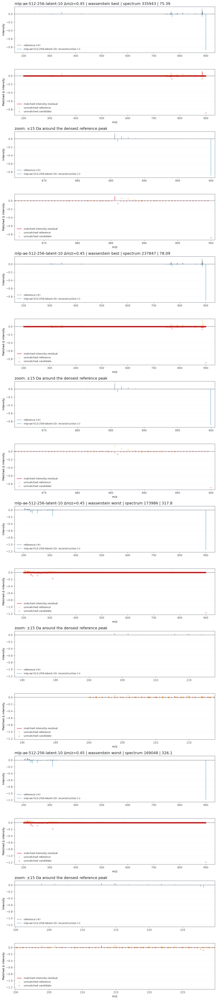

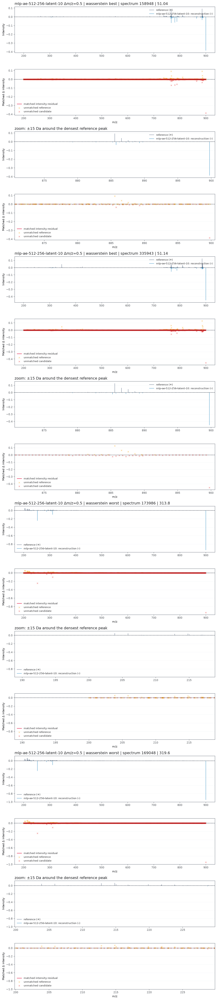

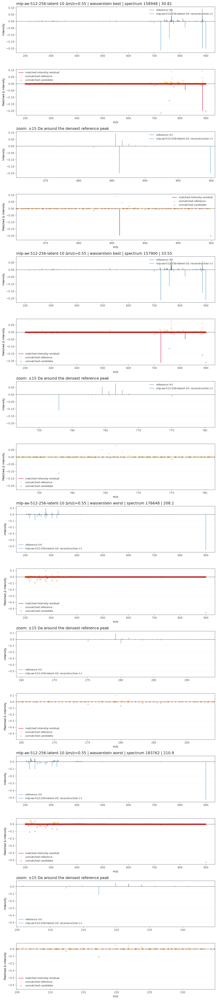

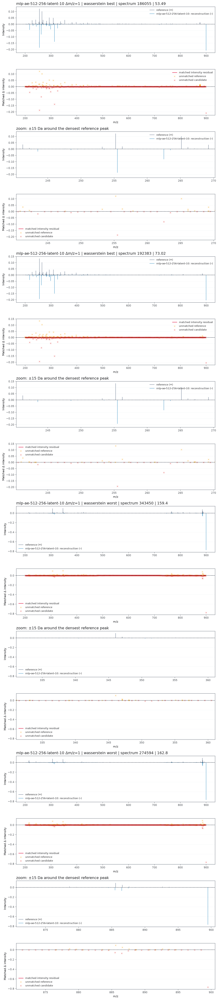

In [ ]:
# MLP architecuter

comparison_best_task_id_by_binning = {
    row["binning_step"]: row["best_task_id"]
    for row in final_summary
    if row["architecture"] == COMPARISON_ARCHITECTURE
}
comparison_best_task_by_binning = {
    binning_step: next(task for task in repetitions if task.task_id == comparison_best_task_id_by_binning[binning_step])
    for binning_step, repetitions in comparison_tasks_by_binning.items()
}

for binning_step, task in comparison_best_task_by_binning.items():
    plot_ranked_model_reconstructions(precompute, comparison_records, task, metric="wasserstein", n_best=2, n_worst=2)


In [50]:
# MLP architecuter
COMPARISON_ARCHITECTURE = "mlp-ae-512-latent-10"

comparison_tasks_by_binning = group_tasks_by_binning(tasks, COMPARISON_ARCHITECTURE)
comparison_records = model_reconstruction_records(
    precompute, comparison_tasks_by_binning, tolerance=TOLERANCE, tolerance_unit=TOLERANCE_UNIT,
)
comparison_summary = summarize_forward_sweep(comparison_records)


2026-08-18 21:48:07,259 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.model_reconstruction_analysis:280 | START model-reconstruction sweep: 500 spectra x 4 binning step(s).
2026-08-18 21:48:07,274 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:48:07,275 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:48:07,275 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:48:07,276 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:48:07,281 | INFO     | msi_autoencoder_wrapper.models.architectures.archit

2026-08-18 21:48:07,521 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.model_reconstruction_analysis:301 | Reconstructed 500 spectra with task 'task_000000' (Δm/z=0.45, normalization=tic) in 0.15s.


Matching task_000000 Δm=0.45:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:48:12,383 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:48:12,384 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:48:12,385 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:48:12,385 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:48:12,390 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='MLPDecoder'.
2026-08-18 21:48:12,396 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000001 Δm=0.45:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:48:18,264 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:48:18,265 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:48:18,266 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:48:18,266 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:48:18,272 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='MLPDecoder'.
2026-08-18 21:48:18,279 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000002 Δm=0.45:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:48:22,929 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:48:22,930 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:48:22,931 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:48:22,931 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:48:22,938 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='MLPDecoder'.
2026-08-18 21:48:22,944 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000003 Δm=0.45:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:48:26,935 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:48:26,935 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:48:26,937 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:48:26,937 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:48:26,943 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='MLPDecoder'.
2026-08-18 21:48:26,948 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000004 Δm=0.45:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:48:32,554 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:48:32,555 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:48:32,556 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:48:32,556 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:48:32,562 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='MLPDecoder'.
2026-08-18 21:48:32,569 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000005 Δm=0.5:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:48:39,020 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:48:39,021 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:48:39,022 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:48:39,025 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:48:39,030 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='MLPDecoder'.
2026-08-18 21:48:39,040 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000006 Δm=0.5:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:48:45,958 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:48:45,959 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:48:45,959 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:48:45,960 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:48:45,967 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='MLPDecoder'.
2026-08-18 21:48:45,972 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000007 Δm=0.5:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:48:50,601 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:48:50,602 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:48:50,602 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:48:50,603 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:48:50,609 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='MLPDecoder'.
2026-08-18 21:48:50,614 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000008 Δm=0.5:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:48:55,820 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:48:55,821 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:48:55,821 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:48:55,822 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:48:55,827 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='MLPDecoder'.
2026-08-18 21:48:55,832 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000009 Δm=0.5:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:49:00,879 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:49:00,880 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:49:00,881 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:49:00,882 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:49:00,886 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='MLPDecoder'.
2026-08-18 21:49:00,891 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000010 Δm=0.55:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:49:05,621 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:49:05,623 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:49:05,624 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:49:05,625 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:49:05,630 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='MLPDecoder'.
2026-08-18 21:49:05,635 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000011 Δm=0.55:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:49:10,663 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:49:10,664 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:49:10,664 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:49:10,665 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:49:10,670 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='MLPDecoder'.
2026-08-18 21:49:10,675 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000012 Δm=0.55:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:49:15,092 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:49:15,092 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:49:15,093 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:49:15,093 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:49:15,099 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='MLPDecoder'.
2026-08-18 21:49:15,105 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000013 Δm=0.55:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:49:19,693 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:49:19,694 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:49:19,694 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:49:19,695 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:49:19,701 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='MLPDecoder'.
2026-08-18 21:49:19,707 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000014 Δm=0.55:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:49:25,113 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:49:25,114 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:49:25,115 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:49:25,116 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:49:25,119 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='MLPDecoder'.
2026-08-18 21:49:25,123 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000015 Δm=1:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:49:28,871 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:49:28,871 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:49:28,872 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:49:28,872 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:49:28,876 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='MLPDecoder'.
2026-08-18 21:49:28,879 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000016 Δm=1:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:49:33,493 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:49:33,494 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:49:33,494 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:49:33,495 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:49:33,499 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='MLPDecoder'.
2026-08-18 21:49:33,505 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000017 Δm=1:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:49:38,628 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:49:38,628 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:49:38,629 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:49:38,629 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:49:38,633 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='MLPDecoder'.
2026-08-18 21:49:38,637 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000018 Δm=1:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:49:45,056 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:49:45,057 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:49:45,058 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:49:45,058 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:49:45,062 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='MLPDecoder'.
2026-08-18 21:49:45,066 | INFO     | msi_autoencoder_wrapper.models.architectu

Matching task_000019 Δm=1:   0%|          | 0/500 [00:00<?, ?spectrum/s]

2026-08-18 21:49:49,867 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.model_reconstruction_analysis:321 | DONE model-reconstruction sweep: 250000 records in 102.61s.


2026-08-18 21:49:50,332 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.binning.model_reconstruction_analysis:381 | Plotting 2 best + 2 worst reconstructed spectra for task_id=task_000002, metric=wasserstein.
2026-08-18 21:49:50,350 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 28 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.
2026-08-18 21:49:50,351 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.
2026-08-18 21:49:50,352 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder
2026-08-18 21:49:50,352 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='MLPEncoder'.
2026-08-18 21:49:50,359 | INFO     | msi_autoencoder_wrapper.m

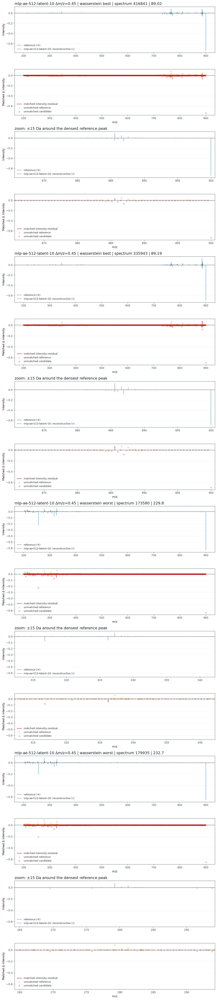

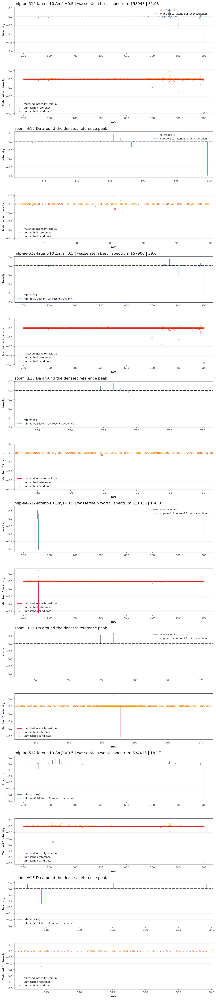

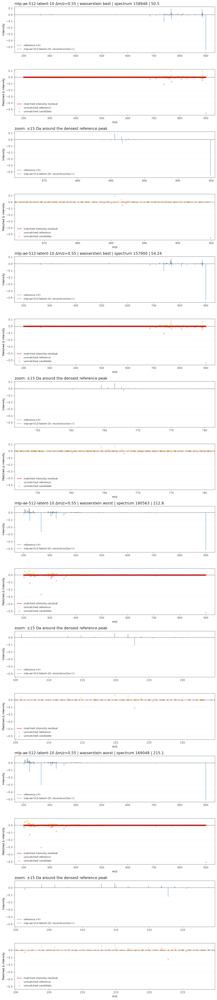

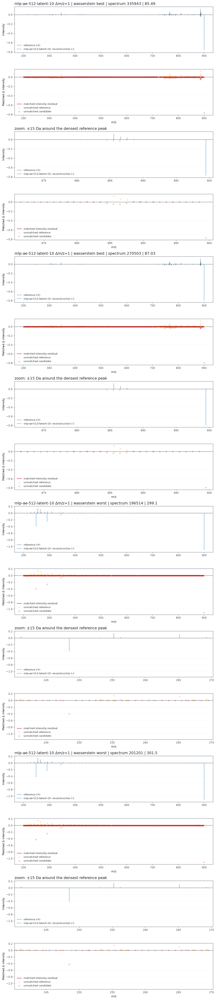

In [51]:

comparison_best_task_id_by_binning = {
    row["binning_step"]: row["best_task_id"]
    for row in final_summary
    if row["architecture"] == COMPARISON_ARCHITECTURE
}
comparison_best_task_by_binning = {
    binning_step: next(task for task in repetitions if task.task_id == comparison_best_task_id_by_binning[binning_step])
    for binning_step, repetitions in comparison_tasks_by_binning.items()
}

for binning_step, task in comparison_best_task_by_binning.items():
    plot_ranked_model_reconstructions(precompute, comparison_records, task, metric="wasserstein", n_best=2, n_worst=2)
